In [65]:
import sys
sys.path.append('/orange/adamginsburg/ALMA_IMF/reduction/analysis')
from spectralindex import prefixes
from astropy.visualization import simple_norm
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
from mpl_toolkits.axes_grid1.inset_locator import TransformedBbox, BboxPatch, BboxConnector
import astropy.visualization.wcsaxes
from spectral_cube import SpectralCube

In [66]:
%matplotlib inline
import pylab as pl

In [67]:
os.chdir('/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/February2021Release/')

In [68]:
prefixes.keys()

dict_keys(['G328', 'G333', 'G12', 'W51IRS2', 'G008', 'G327', 'G10', 'G337', 'G338', 'G351', 'G353', 'W43MM3', 'W43MM2', 'W51-E'])

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

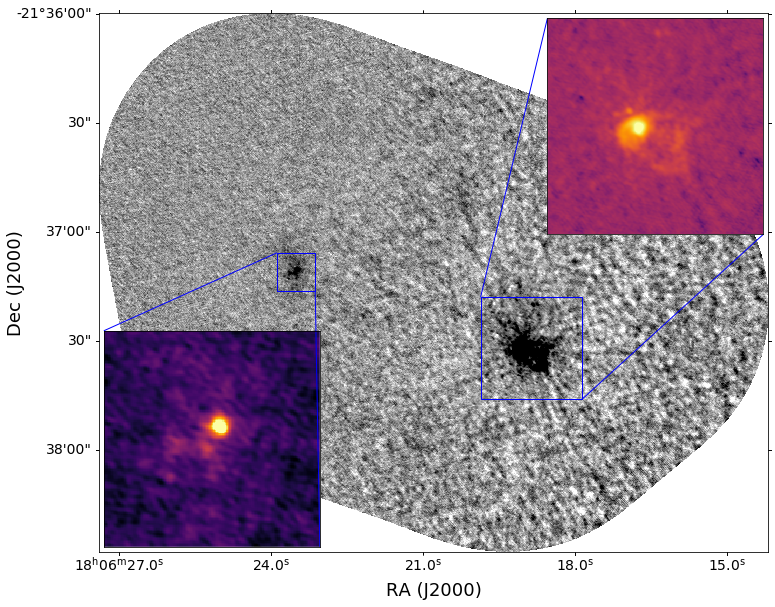

In [69]:
fieldid = 'G008'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1500,1900
yl,yu = 600,1000
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='log')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (700,850)
by,ty = (1025,1175)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.9, min_percent=2, stretch='linear')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)



pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

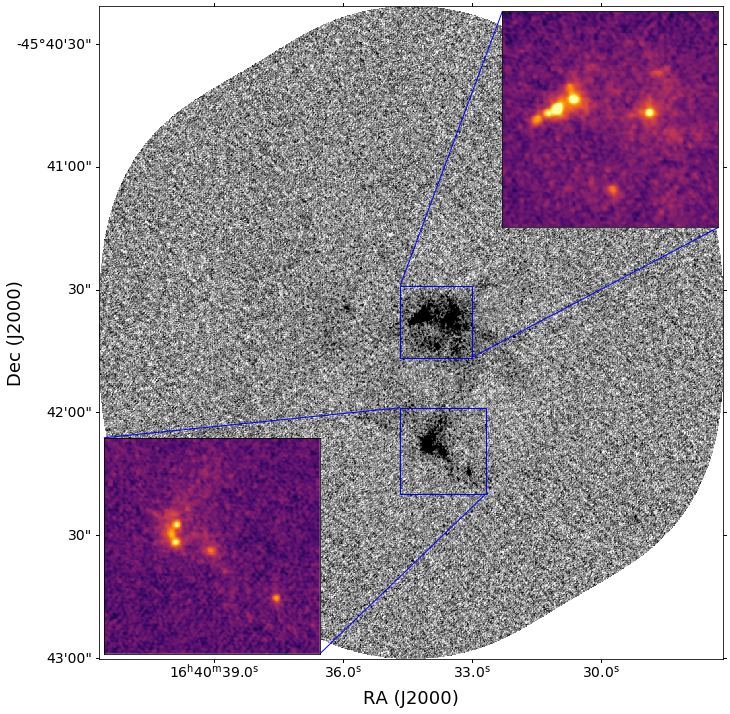

In [70]:
fieldid = 'G338'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1050,1300
yl,yu = 1050,1300
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (1050,1350)
by,ty = (575,875)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

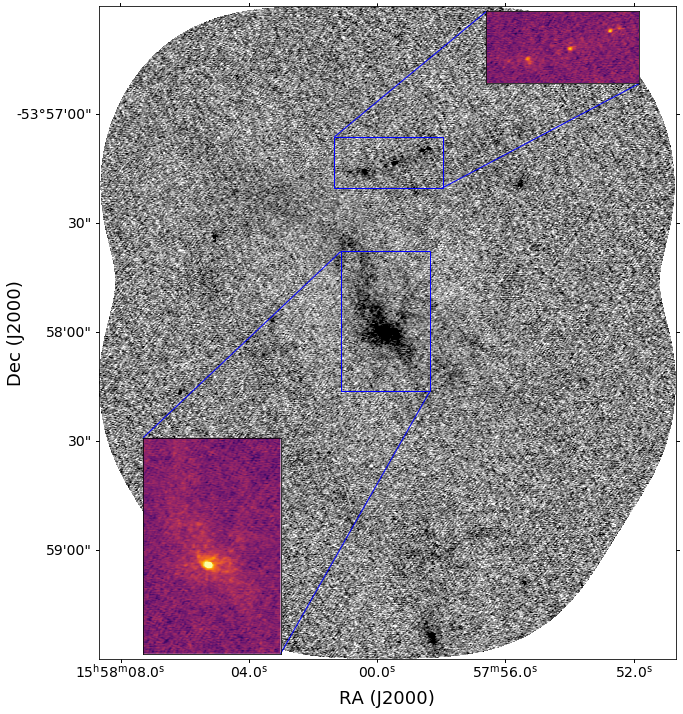

In [89]:
fieldid = 'G328'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 925,1350
yl,yu = 1850,2050
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=1,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = 950,1300
by,ty = 1050,1600
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

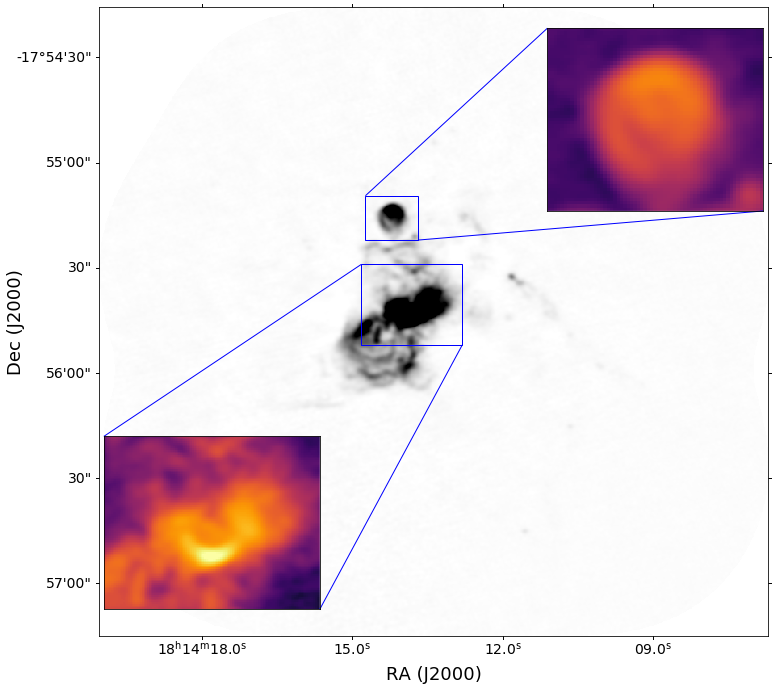

In [96]:
fieldid = 'G12'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 330,395
yl,yu = 490,545
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='log')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (325,450)
by,ty = (360,460)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='log')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

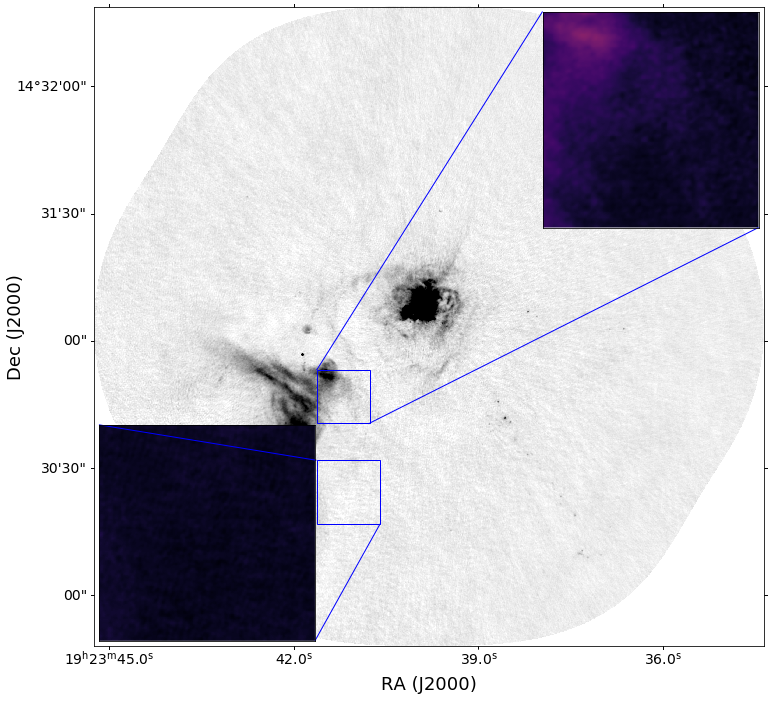

In [73]:
fieldid = 'W51IRS2'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1050,1300
yl,yu = 1050,1300
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (1050,1350)
by,ty = (575,875)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

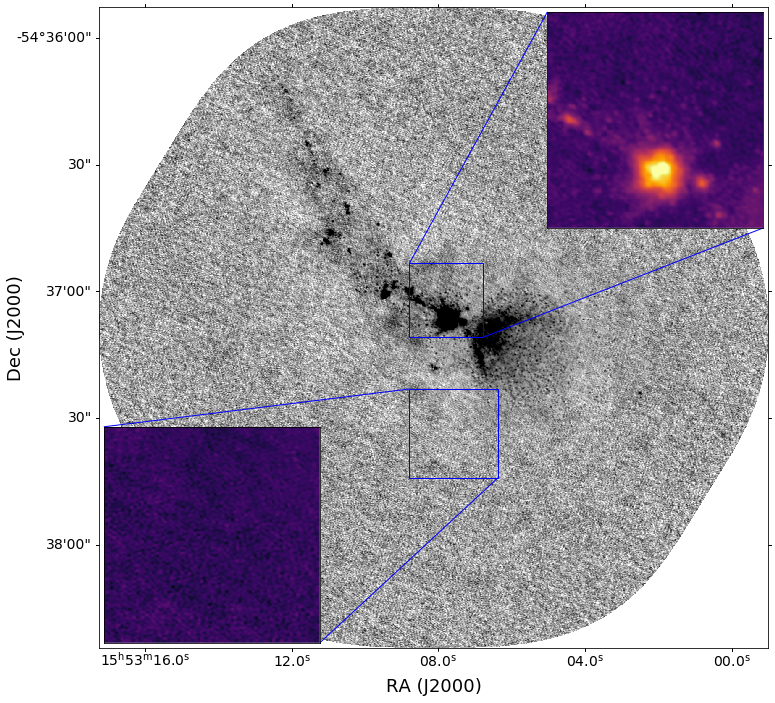

In [74]:
fieldid = 'G327'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1050,1300
yl,yu = 1050,1300
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (1050,1350)
by,ty = (575,875)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

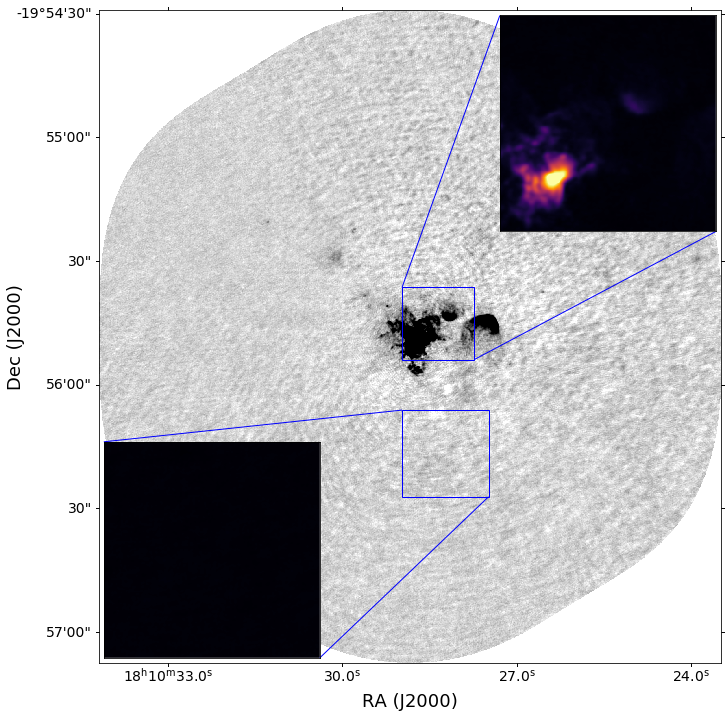

In [75]:
fieldid = 'G10'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1050,1300
yl,yu = 1050,1300
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (1050,1350)
by,ty = (575,875)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)

pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

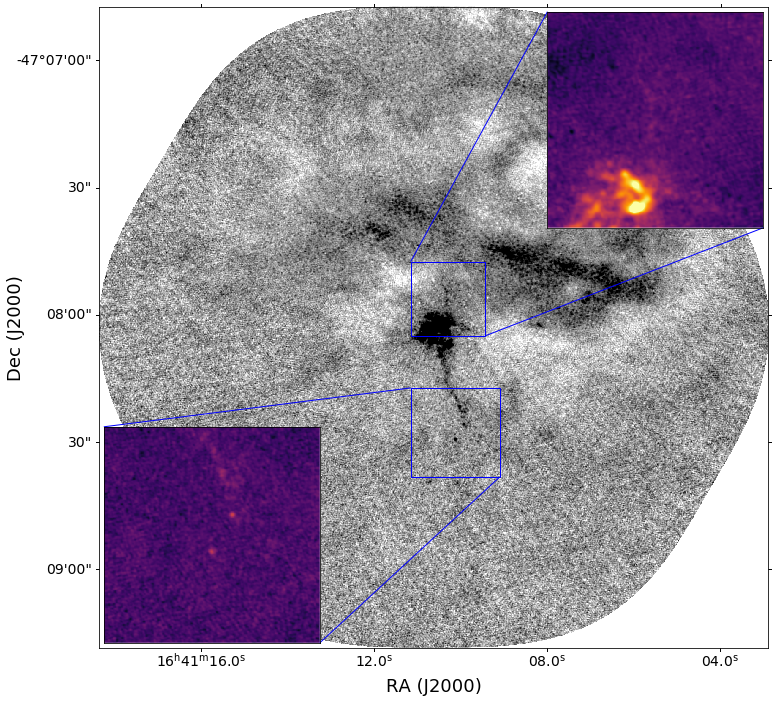

In [76]:
fieldid = 'G337'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1050,1300
yl,yu = 1050,1300
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (1050,1350)
by,ty = (575,875)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

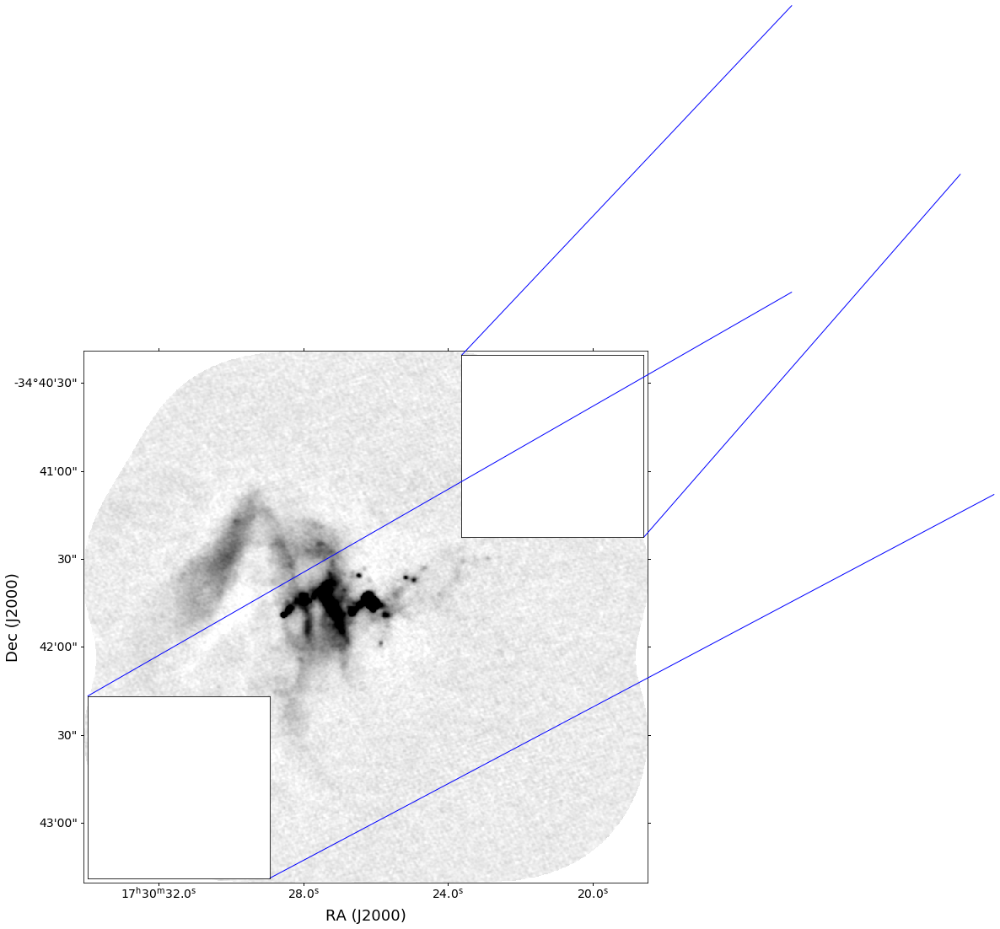

In [77]:
fieldid = 'G353'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1050,1300
yl,yu = 1050,1300
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (1050,1350)
by,ty = (575,875)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)

pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

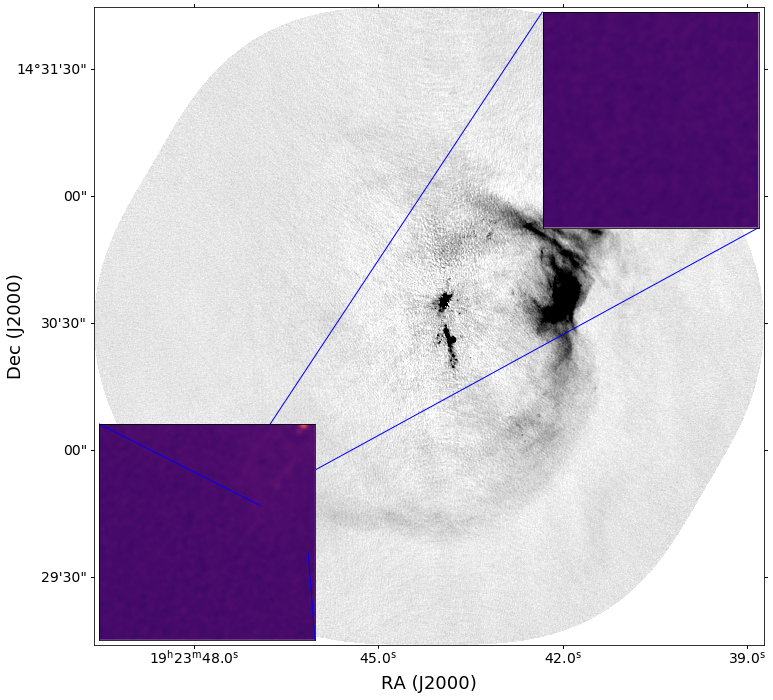

In [78]:
fieldid = 'W51-E'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1050,1300
yl,yu = 1050,1300
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (1050,1350)
by,ty = (575,875)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

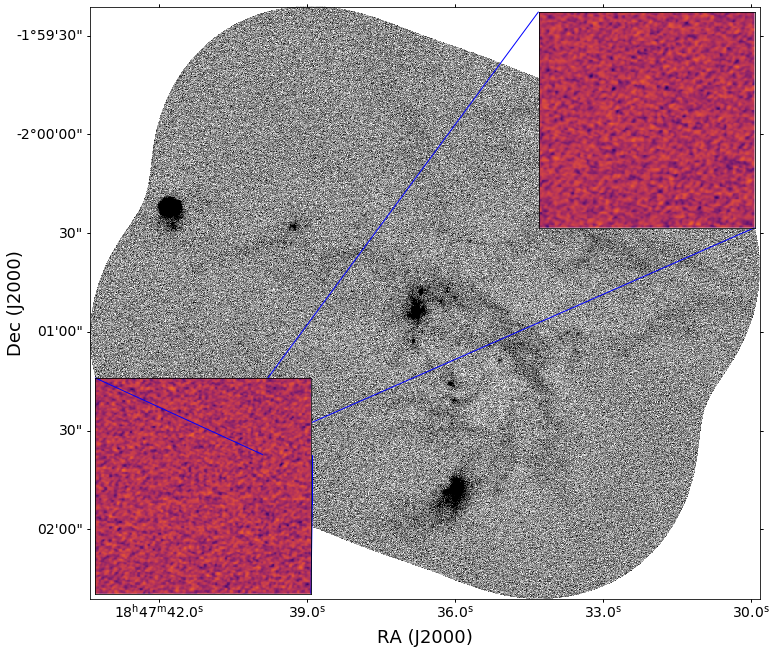

In [79]:
fieldid = 'W43MM2'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1050,1300
yl,yu = 1050,1300
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (1050,1350)
by,ty = (575,875)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

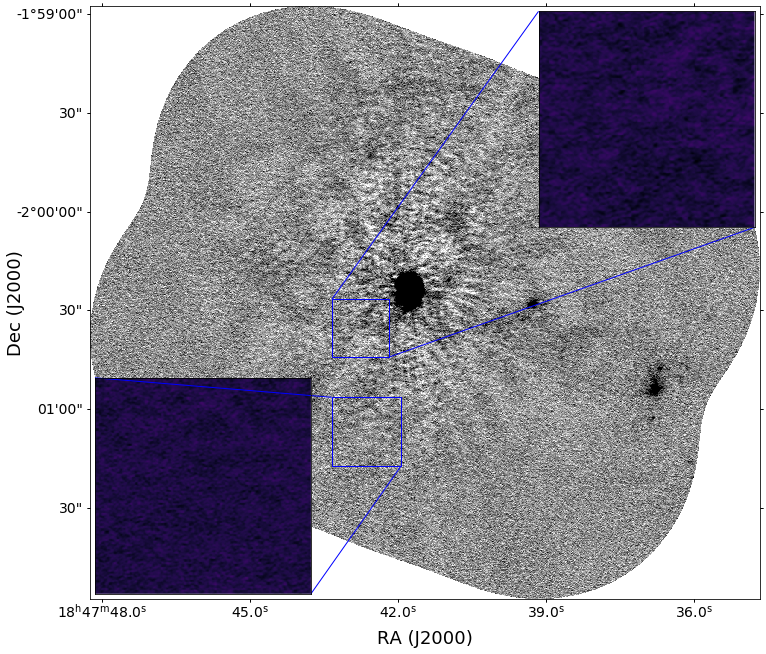

In [80]:
fieldid = 'W43MM3'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1050,1300
yl,yu = 1050,1300
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (1050,1350)
by,ty = (575,875)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')